<a href="https://colab.research.google.com/github/Shahad-Hossain/nasa-image-enhancement/blob/main/Homework89.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import math
import os
from typing import List

from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def loadImageFromDrive(filename: str, driveFolder: str = 'CSC475/Homework7', color="RGB") -> np.ndarray:
  """
  Loads an image from Google Drive into a NumPy array.
  """
  try:
    filePath = f"/content/drive/MyDrive/{driveFolder}/{filename}"

    loadedImgBgr = cv.imread(filePath)

    print(f'Image successfully loaded from: {filePath}')
    if color == "gray":
      return cv.cvtColor(loadedImgBgr, cv.COLOR_BGR2GRAY)

    if color == "RGB":
      return cv.cvtColor(loadedImgBgr, cv.COLOR_BGR2RGB)

    if color == "BGR":
      return loadedImgBgr

  except Exception as e:
    print(f'Error loading image from Drive: {e}')
    return None

In [ ]:
def show(image: np.ndarray, cmap=None, title=None):
    try:
        plt.imshow(image, cmap=cmap)
        plt.title(title)
        plt.axis("off")
        plt.show()
    except Exception as e:
        return ValueError(f"Unknown error occured: {e}")

Image successfully loaded from: /content/drive/MyDrive/CSC475/Homework7//image 7.jpg
Image successfully loaded from: /content/drive/MyDrive/CSC475/Homework7//image 7.jpg


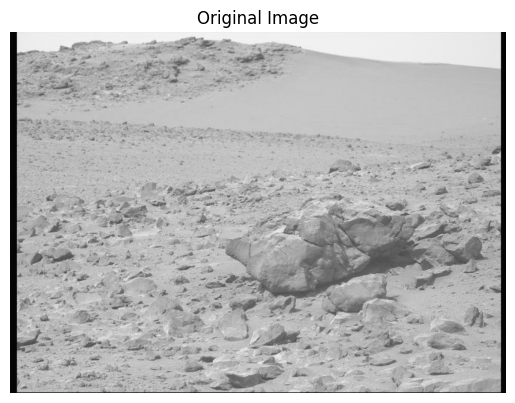

In [ ]:
filename = "/image 7.jpg"
marsImage = loadImageFromDrive(filename, color="RGB")
grayMarsImage = loadImageFromDrive(filename, color="gray")

show(grayMarsImage, cmap="gray", title="Original Image")

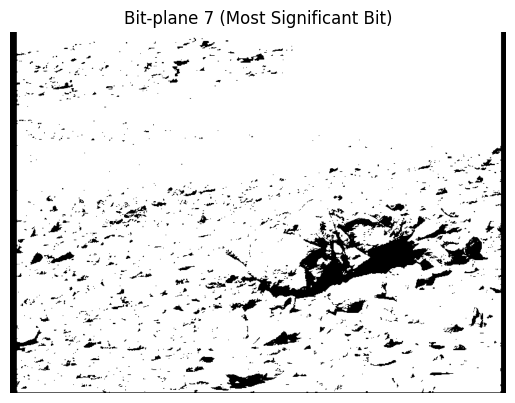

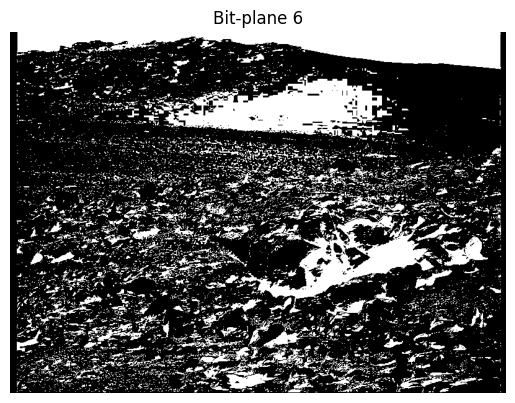

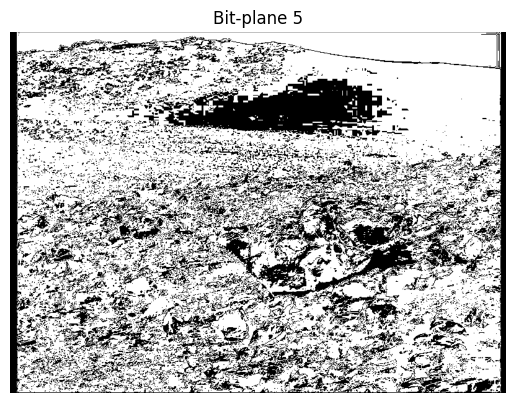

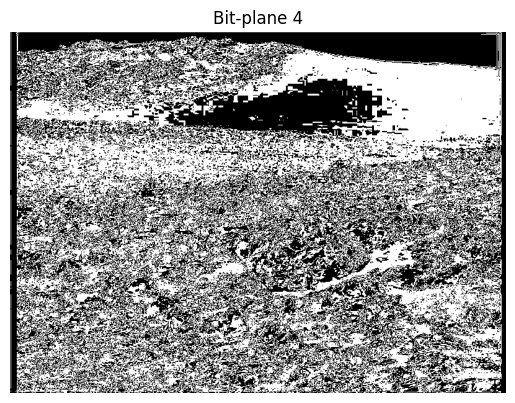

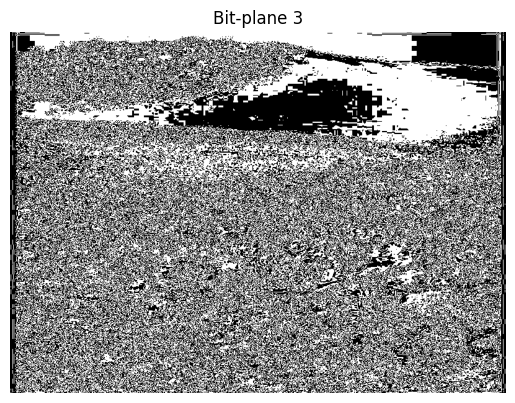

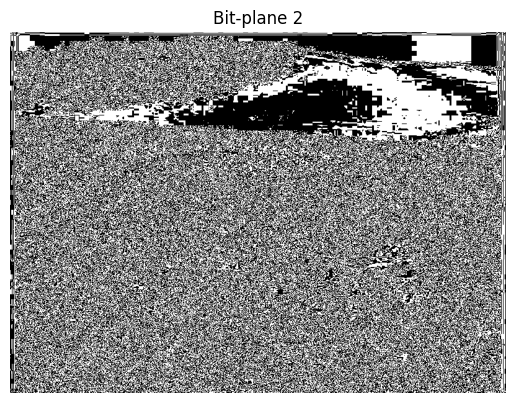

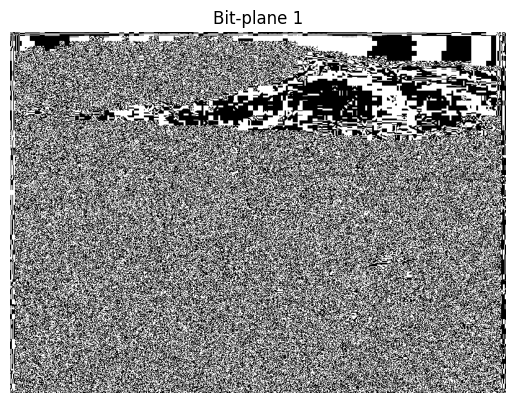

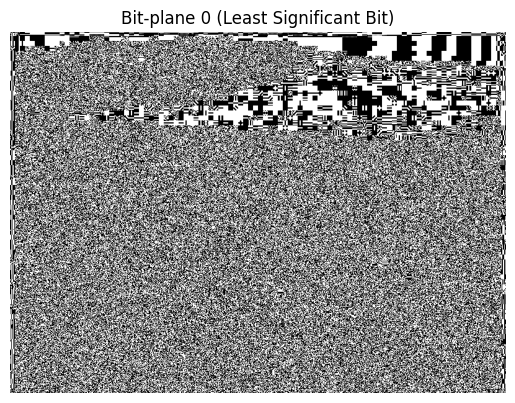

In [ ]:
def bitPlane(image: np.ndarray):
  bitPlanes = []
  image = np.array(image, dtype=np.uint8)

  # Loop from 7 down to 0 (Most Significant Bit to Least Significant Bit)
  for i in range(7, -1, -1):
      # Shift the bits to the right by i, then extract the last bit using bitwise AND
      bit_plane = (image >> i) & 1

      # Scale the 0s and 1s to 0 and 255 for proper grayscale visualization
      bit_plane_scaled = bit_plane * 255

      # Create the appropriate label
      if i == 7:
          title = f"Bit-plane {i} (Most Significant Bit)"
      elif i == 0:
          title = f"Bit-plane {i} (Least Significant Bit)"
      else:
          title = f"Bit-plane {i}"

      bitPlanes.append(bit_plane_scaled)

      # Display the bit-plane using the provided helper function
      show(bit_plane_scaled, cmap="gray", title=title)

  return bitPlanes

bitPlanes = bitPlane(grayMarsImage)

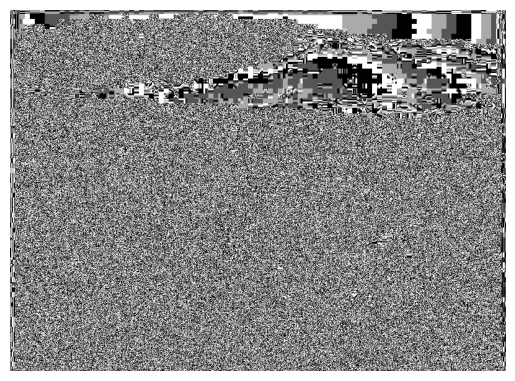

In [ ]:
def reconstructImage(bitPlanes, start_bit=0, end_bit=7):
    """
    Reconstructs an image using a specific range of bit-planes.

    Args:
        bitPlanes: List of 8 bit-plane arrays (0 to 255).
        start_bit: The index of the first bit-plane to include (0 is MSB in your logic).
        end_bit: The index of the last bit-plane to include.
    """
    # Initialize with zeros using the shape of the first plane
    image = np.zeros_like(bitPlanes[0], dtype=np.uint8)

    # Ensure the range stays within 0-7
    for i in range(start_bit, end_bit + 1):
        # Normalize the 0-255 plane to 0-1
        bit = bitPlanes[i] // 255
        # Shift and combine using OR
        image |= (bit.astype(np.uint8) << (7 - i))

    return image

# Example: Reconstruct using only the top 4 bit-planes (0, 1, 2, 3)
reconstructed = reconstructImage(bitPlanes, 6, 7)
show(reconstructed, cmap="gray")

Original size: 267161 bytes
Compressed size: 122432 bytes
Reduction: 144729 bytes


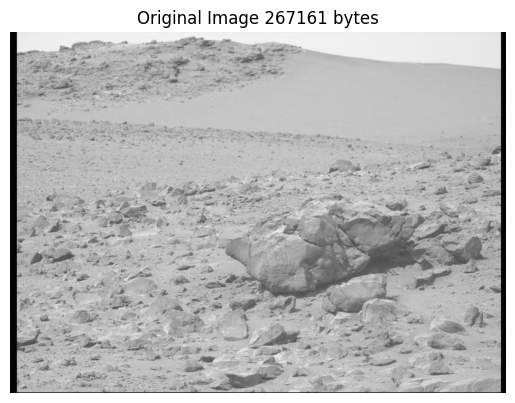

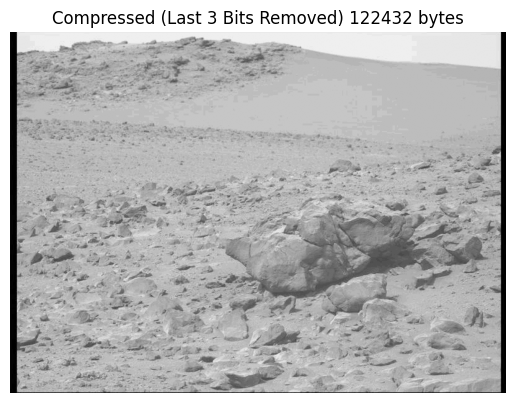

In [ ]:
def compress_remove_last3_bits(image: np.ndarray):
    image = np.array(image, dtype=np.uint8)

    # Mask to zero out last 3 bits
    mask = 0b11111000

    # Apply mask
    compressed = image & mask

    return compressed

# Compress image
compressed_image = compress_remove_last3_bits(grayMarsImage)

# Save both images
original_path = "original.png"
compressed_path = "compressed.png"

cv.imwrite(original_path, grayMarsImage)
cv.imwrite(compressed_path, compressed_image)

# Compare file sizes
original_size = os.path.getsize(original_path)
compressed_size = os.path.getsize(compressed_path)

print(f"Original size: {original_size} bytes")
print(f"Compressed size: {compressed_size} bytes")
print(f"Reduction: {original_size - compressed_size} bytes")

# Show images for comparison
show(grayMarsImage, cmap="gray", title=f"Original Image {original_size} bytes")
show(compressed_image, cmap="gray", title=f"Compressed (Last 3 Bits Removed) {compressed_size} bytes")

In [ ]:
def xor_encrypt_bitplanes(bitPlanes, seed=42):
    np.random.seed(seed)
    encrypted_planes = []
    keys = []

    for plane in bitPlanes:
        key = np.random.randint(0, 2, plane.shape, dtype=np.uint8)
        encrypted = (plane // 255) ^ key
        encrypted_planes.append(encrypted * 255)
        keys.append(key)

    return encrypted_planes, keys

def xor_decrypt_bitplanes(encrypted_planes, keys):
    decrypted_planes = []

    for plane, key in zip(encrypted_planes, keys):
        decrypted = (plane // 255) ^ key
        decrypted_planes.append(decrypted * 255)

    return decrypted_planes

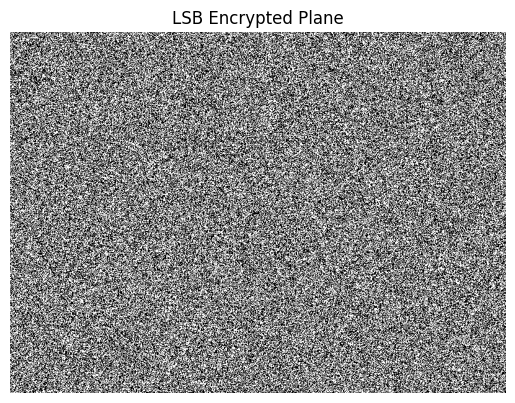

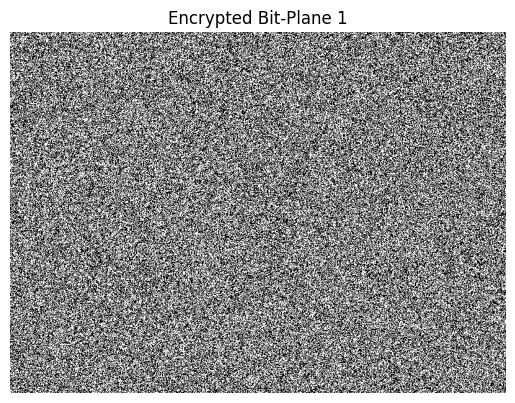

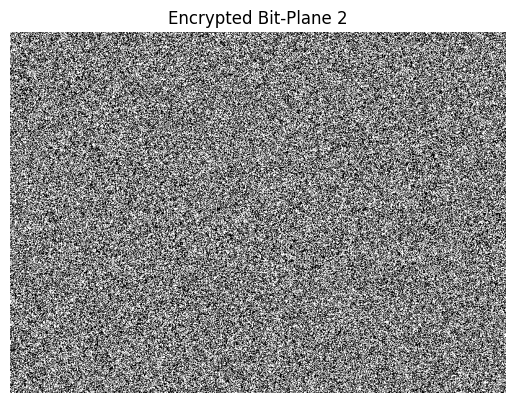

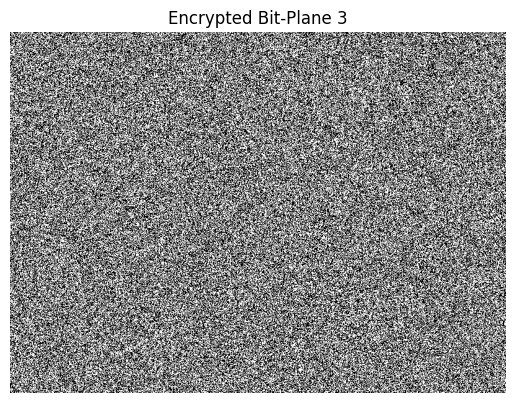

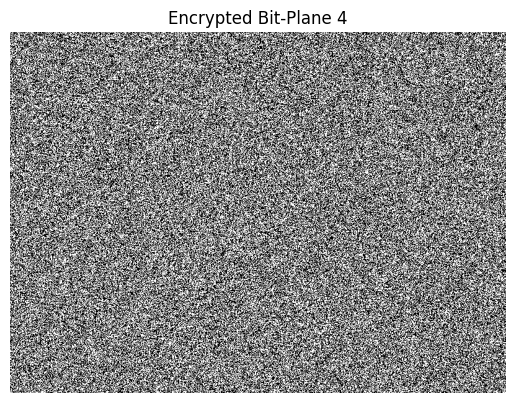

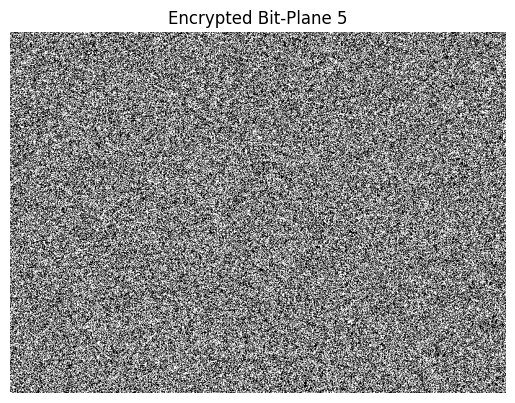

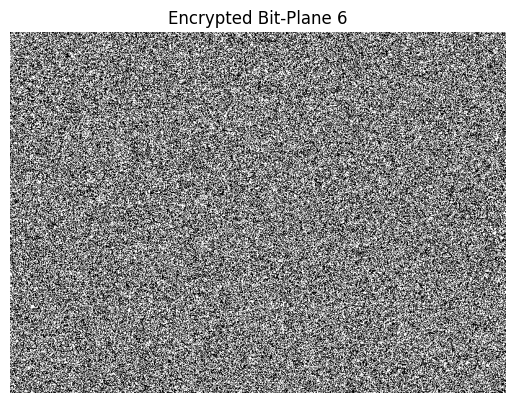

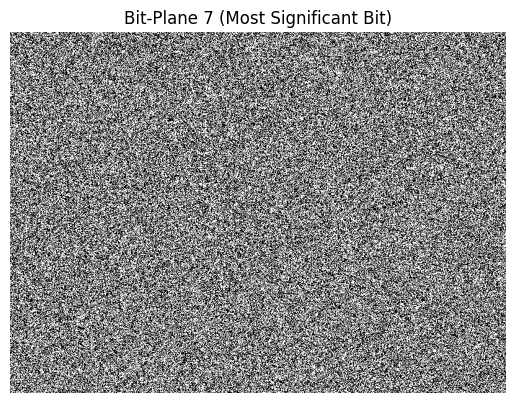

In [ ]:
encryptedPlanes, keys = xor_encrypt_bitplanes(bitPlanes)
for i in range(8):
  if i == 0:
    title = f"LSB Encrypted Plane"
  elif 1 <= i <= 6:
    title = f"Encrypted Bit-Plane {i}"
  else:
    title = f"Bit-Plane 7 (Most Significant Bit)"

  show(encryptedPlanes[i], cmap="gray", title=title)

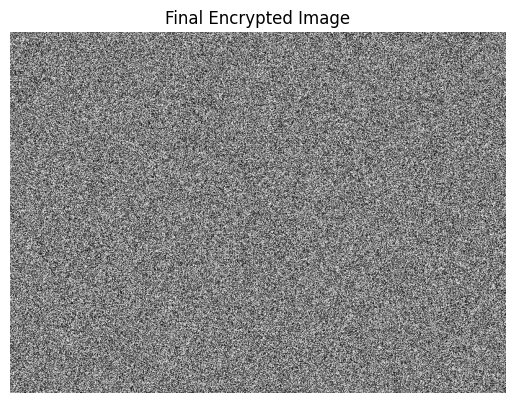

In [ ]:
encryptedImage = reconstructImage(encryptedPlanes)
show(encryptedImage, cmap="gray", title="Final Encrypted Image")

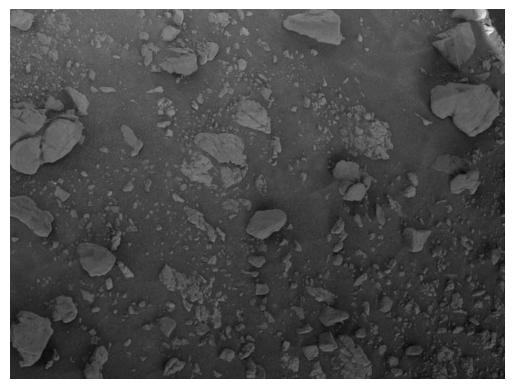

In [ ]:
show(grayMarsImage, cmap="gray")

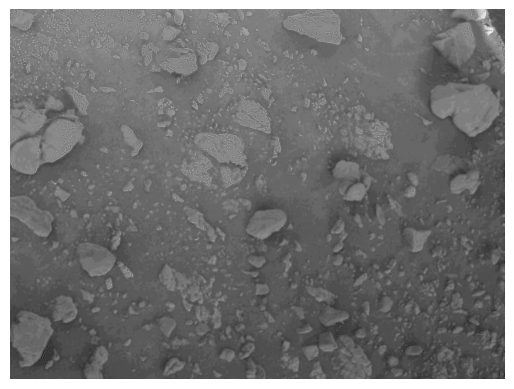

In [ ]:
def boost_specific_planes(bitPlanes, boost_planes=[3, 4, 5], boost_factor=1.25):
    base_image = np.zeros_like(bitPlanes[0], dtype=np.float64)
    detail_image = np.zeros_like(bitPlanes[0], dtype=np.float64)

    for i in range(8):
        plane_num = 7 - i
        bit = bitPlanes[i] // 255
        weight = 2 ** plane_num

        if plane_num in boost_planes:
            # Isolate the planes containing the rock details
            detail_image += bit * weight
        elif plane_num > 3:
            # Reconstruct the rest of the image, dropping noise (planes 0-3)
            base_image += bit * weight

    # Smooth the detail image slightly to prevent harsh binary banding artifacts
    # This turns the bit-plane into a smooth edge-enhancement mask
    detail_image_smoothed = cv.GaussianBlur(detail_image, (3, 3), 0)

    # Combine the base image with the multiplied details
    final_image = base_image + (detail_image_smoothed * boost_factor)

    return np.clip(final_image, 0, 255).astype(np.uint8)


enhancedPlaneImg = boost_specific_planes(bitPlanes)

show(enhancedPlaneImg, cmap="gray")

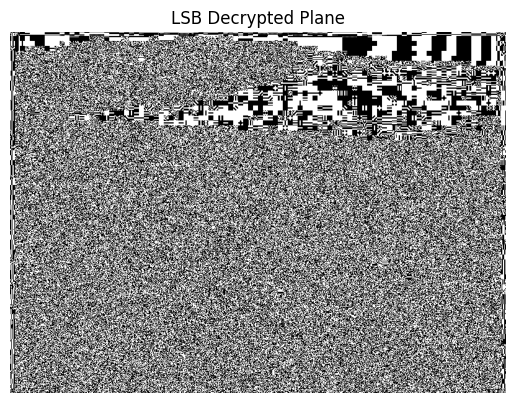

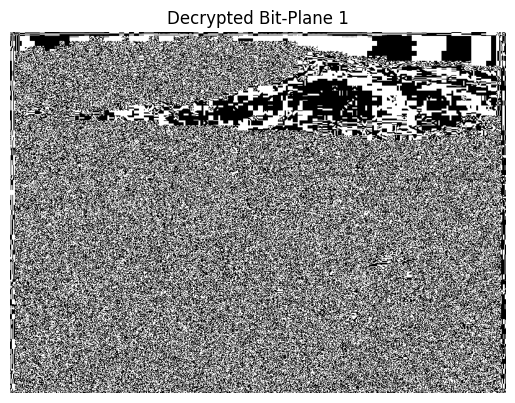

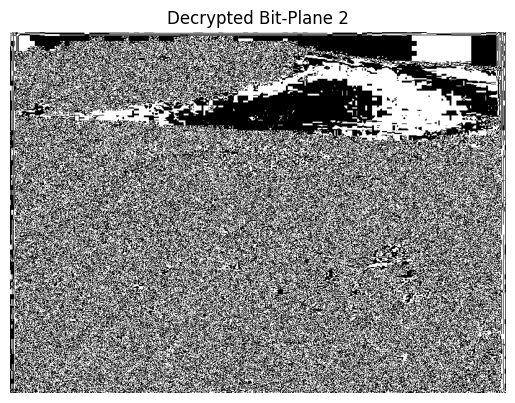

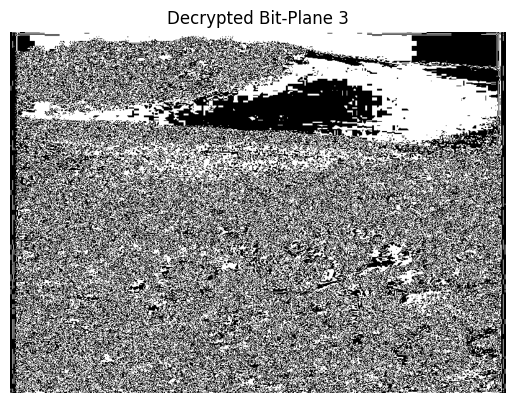

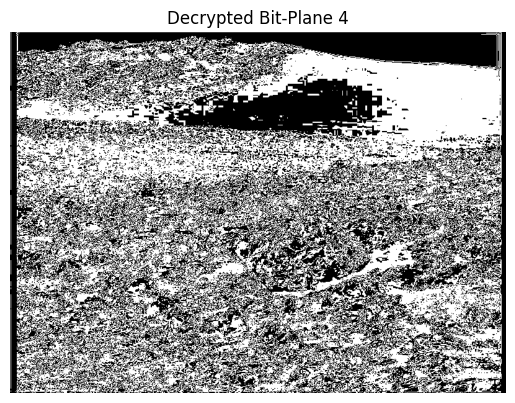

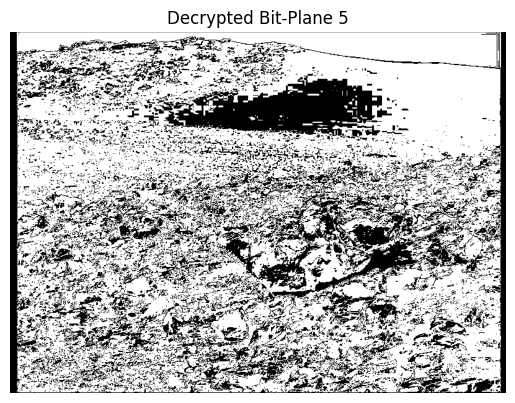

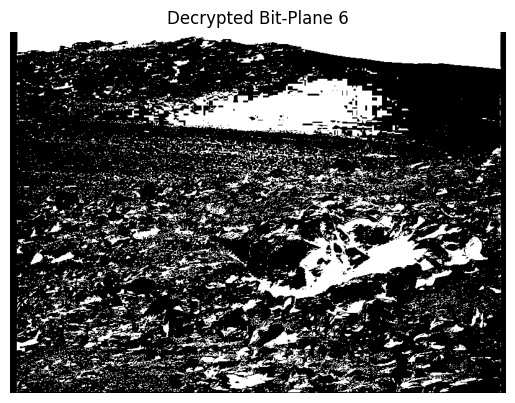

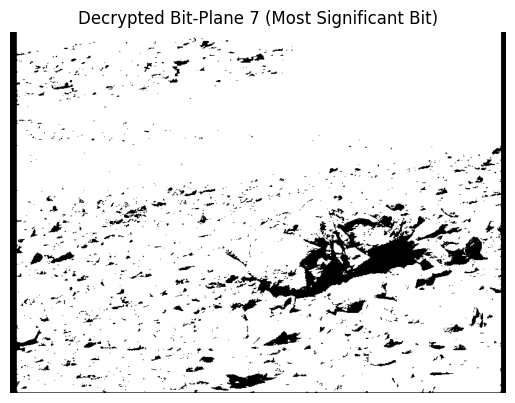

In [ ]:
decryptedPlanes = xor_decrypt_bitplanes(encryptedPlanes, keys)[::-1]

for i in range(8):
  if i == 0:
    title = f"LSB Decrypted Plane"
  elif 1 <= i <= 6:
    title = f"Decrypted Bit-Plane {i}"
  else:
    title = f"Decrypted Bit-Plane 7 (Most Significant Bit)"

  show(decryptedPlanes[i], cmap="gray", title=title)

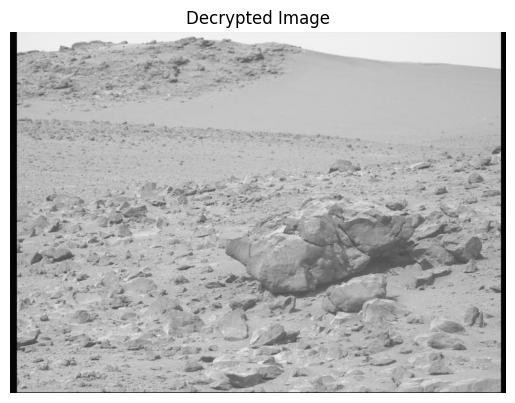

In [ ]:
show(reconstructImage(decryptedPlanes), cmap="gray", title="Decrypted Image")

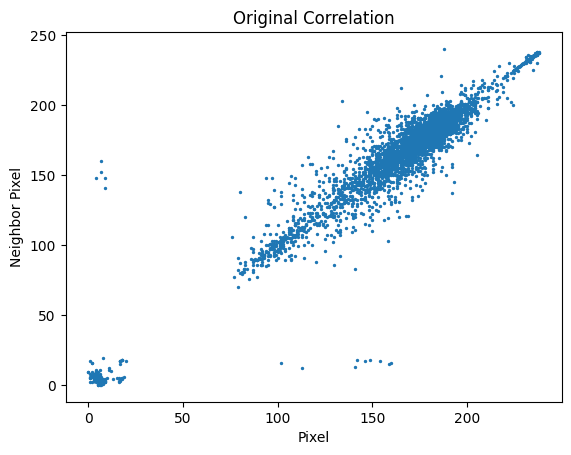

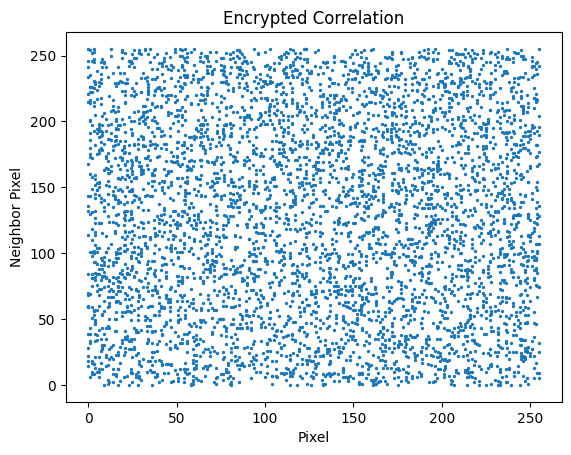

In [ ]:
def plot_correlation(image, title, sample_size=5000):
    x = image[:, :-1].flatten()
    y = image[:, 1:].flatten()

    idx = np.random.choice(len(x), size=sample_size, replace=False)

    plt.figure()
    plt.scatter(x[idx], y[idx], s=2)
    plt.title(title)
    plt.xlabel("Pixel")
    plt.ylabel("Neighbor Pixel")
    plt.show()

plot_correlation(grayMarsImage, "Original Correlation")
plot_correlation(encryptedImage, "Encrypted Correlation")

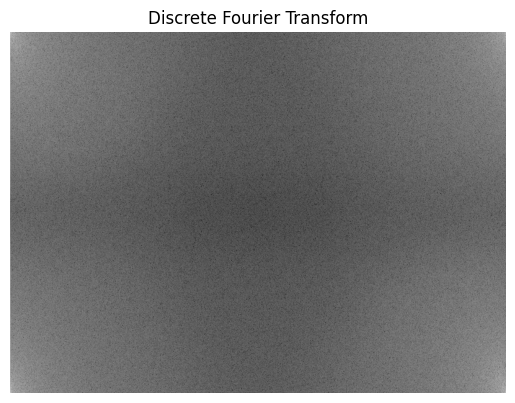

In [ ]:
def dft(image: np.ndarray):
  # Compute FFT
  F = np.fft.fft2(grayMarsImage)

  magnitude = np.log(1 + np.abs(F))

  return magnitude

def dftShift(image: np.ndarray):
  # Compute FFT
  F = np.fft.fft2(grayMarsImage)

  # Shift zero frequency to center
  F_shifted = np.fft.fftshift(F)

  magnitude = np.log(1 + np.abs(F_shifted))

  return magnitude


show(dft(grayMarsImage), cmap="gray", title="Discrete Fourier Transform")

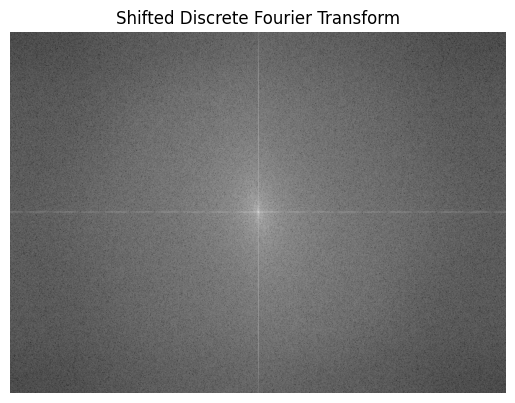

In [ ]:
show(dftShift(grayMarsImage), cmap="gray", title="Shifted Discrete Fourier Transform")

In [ ]:
def encrypt_image(image):
    # 1. Orthogonal Transform
    f_transform = np.fft.fft2(image)
    f_shift = np.fft.fftshift(f_transform)

    # 2. Split into Phase and Magnitude
    magnitude = np.abs(f_shift)
    phase = np.angle(f_shift)

    # 3. Encryption Step (Generating Keys)
    phase_key = np.random.uniform(-np.pi, np.pi, image.shape)
    mag_key = np.random.uniform(0.5, 2.0, image.shape)

    # Apply Encryption
    encrypted_phase = phase + phase_key
    encrypted_magnitude = magnitude * mag_key

    # 4. Recombine Encrypted Components
    encrypted_complex = encrypted_magnitude * np.exp(1j * encrypted_phase)

    # 5. Inverse Transform
    f_ishift = np.fft.ifftshift(encrypted_complex)
    encrypted_image_complex = np.fft.ifft2(f_ishift)

    return encrypted_image_complex, phase_key, mag_key

def decrypt_image(encrypted_image_complex, phase_key, mag_key):
    # 1. Orthogonal Transform of the Encrypted Information
    # (Notice we are transforming the complex data)
    f_transform = np.fft.fft2(encrypted_image_complex)
    f_shift = np.fft.fftshift(f_transform)

    # 2. Extract Encrypted Phase and Magnitude
    enc_magnitude = np.abs(f_shift)
    enc_phase = np.angle(f_shift)

    # 3. Decryption Step (Reverse the mathematical operations)
    decrypted_magnitude = enc_magnitude / mag_key
    decrypted_phase = enc_phase - phase_key

    # 4. Recombine Decrypted Components
    decrypted_complex = decrypted_magnitude * np.exp(1j * decrypted_phase)

    # 5. Inverse Transform
    f_ishift = np.fft.ifftshift(decrypted_complex)
    decrypted_image_complex = np.fft.ifft2(f_ishift)

    # Because the original image had Hermitian symmetry, the decrypted
    # image will naturally be real again. We can safely discard the float dust.
    return np.real(decrypted_image_complex)


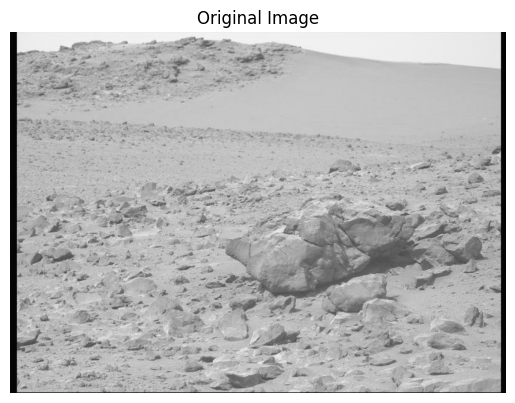

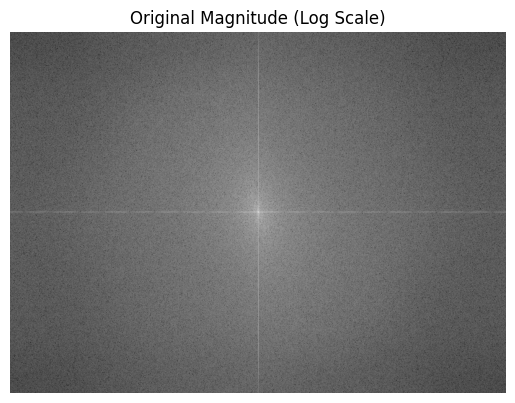

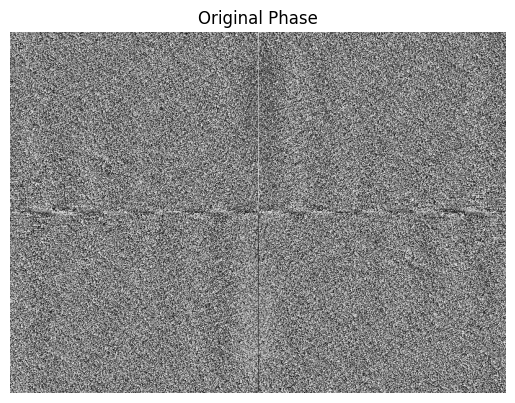

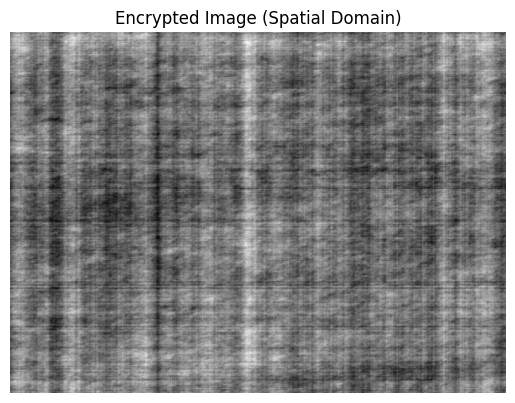

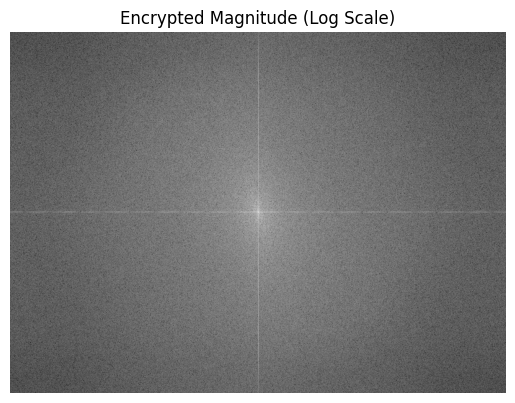

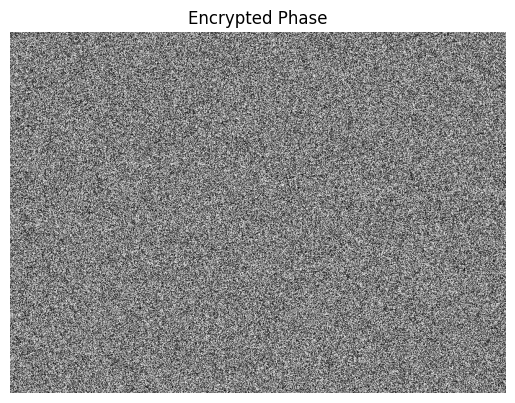

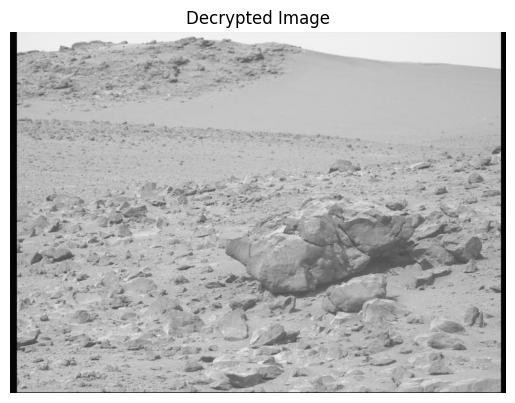

In [ ]:
# 1. Orthogonal Transform of the Original Image
f_transform = np.fft.fft2(grayMarsImage)
f_shift = np.fft.fftshift(f_transform)

# 2. Extract Original Phase and Magnitude
magnitude = np.abs(f_shift)
phase = np.angle(f_shift)

# 3. Encrypt
encrypted_img, p_key, m_key = encrypt_image(grayMarsImage)

# 4. Decrypt
decrypted_img = decrypt_image(encrypted_img, p_key, m_key)

# 5. Extract Encrypted Phase and Magnitude
f_transform_enc = np.fft.fft2(encrypted_img)
f_shift_enc = np.fft.fftshift(f_transform_enc)

enc_magnitude = np.abs(f_shift_enc)
enc_phase = np.angle(f_shift_enc)

# ==========================================
# Plotting the results
# ==========================================

# --- Original Image & Its Frequency Domain ---
show(grayMarsImage, cmap="gray", title="Original Image")
show(np.log(1 + magnitude), cmap="gray", title="Original Magnitude (Log Scale)")
show(phase, cmap="gray", title="Original Phase")

# --- Encrypted Image & Its Frequency Domain ---
show(np.abs(encrypted_img), cmap="gray", title="Encrypted Image (Spatial Domain)")
show(np.log(1 + enc_magnitude), cmap="gray", title="Encrypted Magnitude (Log Scale)")
show(enc_phase, cmap="gray", title="Encrypted Phase")

# --- Decrypted Result ---
show(decrypted_img, cmap="gray", title="Decrypted Image")

Maximum difference between arrays: 72590259.43431678
Average difference per pixel: 2963.145450338812
Are the arrays exactly identical? False


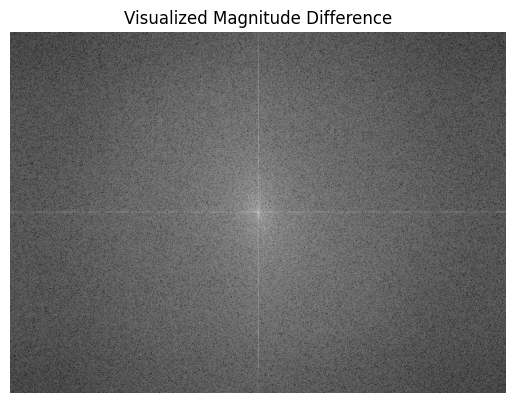

In [ ]:
# 1. Calculate the raw difference
mag_difference = np.abs(magnitude - enc_magnitude)

# 2. Prove it mathematically by printing the stats
print(f"Maximum difference between arrays: {np.max(mag_difference)}")
print(f"Average difference per pixel: {np.mean(mag_difference)}")
print(f"Are the arrays exactly identical? {np.array_equal(magnitude, enc_magnitude)}")

# 3. Prove it visually by applying a log scale to the difference!
show(np.log(1 + mag_difference), cmap="gray", title="Visualized Magnitude Difference")